# Анализ рынка заведений общественного питания Москвы

**Описание проекта**

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Цель**

Изучить датафрейм, попробовать найти интересные особенности и сделать выводы, дать рекомендации

Для работы представлен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. 

Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Итоговая презентация: https://disk.yandex.ru/i/EBNJncUc1wbnTg

**Описание данных**

- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
   -  «Средний счёт: 1000–1500 ₽»;
   -  «Цена чашки капучино: 130–220 ₽»;
   - «Цена бокала пива: 400–600 ₽».

- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
  
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

In [1]:
#импортируем необходимые бибилотеки
!pip install folium
!pip install geojson
import json
import folium
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from cycler import cycler
from folium.plugins import MarkerCluster
from folium import Map, Choropleth, Marker
from matplotlib.pyplot import MultipleLocator

import warnings
warnings.filterwarnings("ignore")


# Изучение данных

In [2]:
#введем единый стиль для графиков

mpl.rcParams['xtick.labelsize'] = 14
mpl.rcParams['ytick.labelsize'] = 14
mpl.rcParams['axes.titlesize'] = 14
mpl.rcParams['axes.labelsize'] = 14


In [3]:
try:
    df = pd.read_csv('C:/Users/belle/OneDrive/Рабочий стол/Новая папка/Мои проекты/moscow_places.csv')
except:
    df = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
df.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0


В `df` представлен датафрейм с описанием заведений города Москвы

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего в таблице 14 столбцов и 8406 строк, есть пропущенные значения


Данные выгрузились корректно,нет необходимости менять их тип. Всего 7 столбцов с числовым значением, и 7 с текстом

In [6]:
print(f'В датафрейме представлено {df["name"].nunique()} заведений')

В датафрейме представлено 5614 заведений


## Предобработка данных

In [7]:
#проверим на наличие дубликатов

df[df.duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


Дубликатов строк нет

In [8]:
#проверим количество пропусков

df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

В 6 столбцах есть пропуски разной значимости. Например, в столбце `hours` их 536, а в `middle_coffee_cup` 7871 при общем количестве в 8406 строк

Посчитаем количество пропущенных значений для каждого столбца


In [9]:
for e in ['hours', 'price','avg_bill', 'middle_avg_bill', 'middle_coffee_cup','seats']:
    print(f'В столбце {e} {df[e].isna().sum()} пропущенных значений, то есть {round(df[e].isna().sum() * 100/df.shape[0])}%')

В столбце hours 536 пропущенных значений, то есть 6%
В столбце price 5091 пропущенных значений, то есть 61%
В столбце avg_bill 4590 пропущенных значений, то есть 55%
В столбце middle_avg_bill 5257 пропущенных значений, то есть 63%
В столбце middle_coffee_cup 7871 пропущенных значений, то есть 94%
В столбце seats 3611 пропущенных значений, то есть 43%


Пройдемся по некоторым столбцам с целью изучения на неявные дубликаты и другие параметры

2. `category` - категория заведения

In [10]:
# посмотрим какие типы заведений встречаются в столбце
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

Всего 8 типов заведений, дубликатов нет

3. `address` - адрес заведения

In [11]:
#проверим адреса на наличие названия города Москвы

df[~df['address'].str.contains('Москва')]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [12]:
#проверим есть ли дубликаты адресов
df['address'].duplicated().sum()

2653

Не будем заполнять пропущенные значения, так как их слишком много

Во всех адресах указана Москва, есть дубликаты адресов, их 2653, что абсолютно нормально, в одном здании могут располагаться несколько заведений

In [13]:
#посмотрим как много заведений может быть в одном доме

df['address'].value_counts().head(10)

Москва, проспект Вернадского, 86В       28
Москва, Усачёва улица, 26               26
Москва, площадь Киевского Вокзала, 2    20
Москва, Ярцевская улица, 19             20
Москва, Каширское шоссе, 61Г            16
Москва, Хорошёвское шоссе, 27           16
Москва, Щёлковское шоссе, вл75          16
Москва, Пресненская набережная, 2       16
Москва, Лесная улица, 20, стр. 3        16
Москва, проспект Мира, 211к2            16
Name: address, dtype: int64

Путем исследования карты городастало понятно, что по вышеуказанным  адресам находятся торговые центры, в которых больше фуд-корты, аномалий нет

Добавим столбец `street` с названиями улиц из столбца с адресом

In [14]:
#напишем функцию, принимающую название адреса и выводяющую название улицы

def street(address):
    if 'МКАД' in address:
        return ' '.join(address.split(' ')[1:4])[:-1]
    return address.split(',')[1][1:]
    
df['street'] = df['address'].apply(street)

4. `district` - округ, в котором находится заведение

In [15]:
print('Количество уникальных значений равно', df['district'].nunique())
print()
print(df['district'].unique())

Количество уникальных значений равно 9

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


В столбце данные указаны верно, неявных дубликатов нет

5. `hours` - режим работы

В столбце представлено много уникальных значений, разделим их на дву больше группы

Добавим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
 - True — если заведение работает ежедневно и круглосуточно
 - False — в противоположном случае

In [16]:
#заполним пропуски в столбце 'hours' словом 'unknown'
df['hours'] = df['hours'].fillna('unknown')

#напишем функцию, принимающую время работы и выводящую работает круглосуточно и ежедневно магазин или нет
def time (hours):
    return 'ежедневно' in hours and 'круглосуточно' in hours

df['is_24/7'] = df['hours'].apply(time)

6. `lat` - широта географической точки, в которой находится заведение
7. `lng` - долгота географической точки, в которой находится заведение

In [17]:
for e in ['lat', 'lng']:
    print(f'Минимальное значение {e} равно {df[e].min()}')
    print(f'Максимальное значение {e} равно {df[e].max()}')
    print()

Минимальное значение lat равно 55.573942
Максимальное значение lat равно 55.928943

Минимальное значение lng равно 37.355651
Максимальное значение lng равно 37.874466



Географические координаты казаны корректно, нет выбивающихся значений

9. `rating`

In [18]:
#найдем минимальный и максимальный рейтинг заведения

print('Минимальный рейтинг равен', df['rating'].min())
print('Максимальный рейтинг равен', df['rating'].max())

Минимальный рейтинг равен 1.0
Максимальный рейтинг равен 5.0


Аномальных значений нет, значения варьируются от 1 до 5

10. `price` - категория цен в заведении

In [19]:
#проверим уникальные значения
df['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

Всего 4 вида оценки заведения, дубликатов нет

12. `middle_avg_bill` - число с оценкой среднего чека, которое указано только для значений из столбца `avg_bill`, начинающихся с подстроки «Средний счёт»

In [20]:
print('Минимальное значение в столбце равно', df['middle_avg_bill'].min())
print('Максимальное значение в столбце равно', df['middle_avg_bill'].max())

Минимальное значение в столбце равно 0.0
Максимальное значение в столбце равно 35000.0


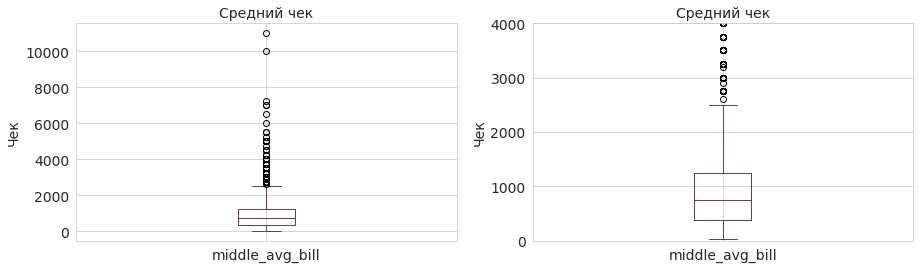

In [87]:
plt.figure(figsize=(15,4))

plt.subplot(1,2,1)
df.boxplot(column='middle_avg_bill', color='#723D46')

plt.title('Cредний чек')
plt.ylabel('Чек')


plt.subplot(1,2,2)
df.boxplot(column='middle_avg_bill', color='#723D46')

plt.title('Cредний чек')
plt.ylabel('Чек')
plt.ylim(0, 4000)

plt.show()

Довольно много выбросов в бОльшую сторону. Но заведения со средним чеком в 7 тысяч рублей легко представить в центре Москвы. 

Уберем заведения со средним чеком в 0 рублей и в 35000

In [22]:
df = df.query('middle_avg_bill !=0 and middle_avg_bill!=35000')

13. `middle_coffee_cup` - число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»

94% строк в столбце пустые

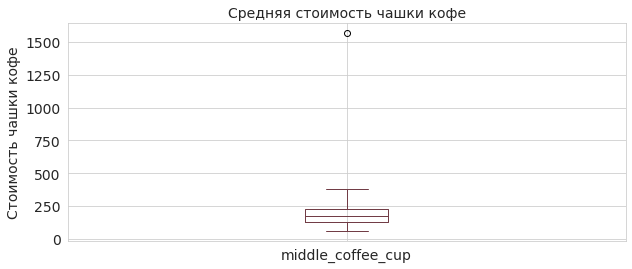

In [91]:
plt.figure(figsize=(10,4))

df.boxplot(column='middle_coffee_cup', color='#723D46')

plt.title('Cредняя стоимость чашки кофе')
plt.ylabel('Стоимость чашки кофе')
plt.show()

Поменяем значение в 1600 за чашку кофе на Nan

df.query('middle_coffee_cup == 1600')['middle_coffee_cup'] = np.NaN

14. `chain` - число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки)

In [25]:
df['chain'].value_counts()

0    5200
1    3204
Name: chain, dtype: int64

Других значений, кроме 0 и 1 в столбце нет

15. `seats` - количество посадочных мест

In [26]:
print(df['seats'].min())
print(df['seats'].max())

0.0
1288.0


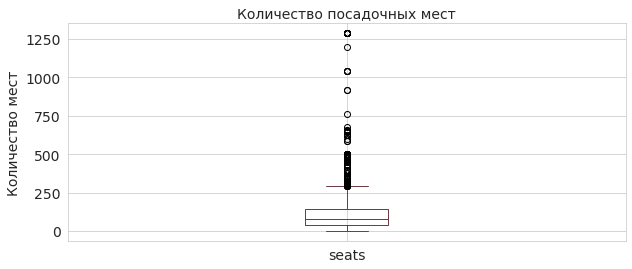

In [92]:
plt.figure(figsize=(10,4))

df.boxplot(column='seats', color='#723D46')

plt.title('Количество посадочных мест')
plt.ylabel('Количество мест')

plt.show()

По диаграмме видно довольно много выбросов, но их убирать не будем, так как такое количество посадочных мест вполне может быть

Мы закончили предобработку данных.

В работе будем анализировать датафрейм, состоящий из 16 столбцов и 8406 строк, всего в таблице 5614 заведений

Явных дубликатов в датасете не было, но довольно много пропусков. Было принятно решение не заполнять их и не удалять.

Из изменений -  удалили три значения, так как это были сильно выбивающиеся значения

## Анализ данных

In [28]:
#установим палитру цветов и стиль для графиков
color = ({'кафе':'#C9CBA3',
          'ресторан':'#FFE1A8',
          'кофейня':'#E26D5C',
          'пиццерия':'#723D46',
          'бар,паб':'#0A5F38',
          'быстрое питание':'#AE8185',
          'булочная':'#C9B8B9',
          'столовая':'#F1CED1'
})

color_dis = ({'Северный административный округ':'#C9CBA3',
          'Северо-Восточный административный округ':'#FFE1A8',
          'Северо-Западный административный округ':'#E26D5C',
          'Западный административный округ':'#723D46',
          'Центральный административный округ':'#0A5F38',
          'Юго-Восточный административный округ':'#AE8185',
          'Восточный административный округ':'#C9B8B9',
          'Юго-Западный административный округ':'#F1CED1',
          'Южный административный округ':'#F0C4A0'
})

ax = sns.set_style('whitegrid')

Анализ датасета начнем с изучения категорий заведений

In [29]:
#создадим датафрйем с количеством заведений по каждой категории и процентном выражении

category = df['category'].value_counts().to_frame()
total = category['category'].sum()
category['%'] = round(category['category'] * 100 / total, 1)

category.sort_values(by='%', ascending=False)

,category,%
кафе,2378,28.3
ресторан,2042,24.3
кофейня,1412,16.8
"бар,паб",765,9.1
пиццерия,633,7.5
быстрое питание,603,7.2
столовая,315,3.7
булочная,256,3.0


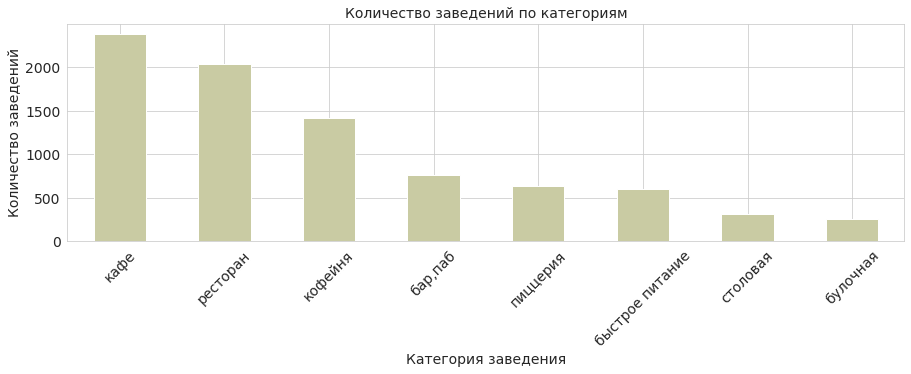

In [93]:
#построим столбчатую диаграмму для визуализации
plt.figure(figsize=(15,4))

category['category'].plot(kind='bar', color='#C9CBA3')

plt.xticks(rotation=45)
plt.title('Количество заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')

plt.show()

Представлено 8 категорий заведений. Чаще всего встречаются кафе и рестораны. Суммарно они составляют более половины от всего рынка.

Почти 17% составляют кофейни, остальные категории составляют  менее 10%.

Меньше всего столовых (3.7% и булочных 3%)

Рассмотрим количество посадочных мест по категориям

Раннее мы выяснили, что в столбце `seats` 3611 пропущенных значений, то есть 43%, что довольно много. 

Интересно узнать по какому принципу распределяли места по заведениям, если речь идет о фуд-кортах. Ранее мы смотрели адреса, на которых располагается несколько заведений, посмотрев на карту можно убедиться, что там действительно торговый центр с зоной фуд-корта

In [31]:
#для каждого адреса (где много заведений в одном здании) выведем три первые строки с указанным адресом и количеством мест 
addr_food = df['address'].value_counts().head(5).index

for e in addr_food:
    print(e)
    display(df.query('address == @e')[['address', 'seats']].head(3))


Москва, проспект Вернадского, 86В


,address,seats
6531,"Москва, проспект Вернадского, 86В",NaN
6532,"Москва, проспект Вернадского, 86В",NaN
6534,"Москва, проспект Вернадского, 86В",NaN


Москва, Усачёва улица, 26


,address,seats
4007,"Москва, Усачёва улица, 26",100.0
4027,"Москва, Усачёва улица, 26",100.0
4050,"Москва, Усачёва улица, 26",100.0


Москва, Ярцевская улица, 19


,address,seats
3012,"Москва, Ярцевская улица, 19",276.0
3022,"Москва, Ярцевская улица, 19",276.0
3024,"Москва, Ярцевская улица, 19",276.0


Москва, площадь Киевского Вокзала, 2


,address,seats
3911,"Москва, площадь Киевского Вокзала, 2",300.0
3928,"Москва, площадь Киевского Вокзала, 2",300.0
3930,"Москва, площадь Киевского Вокзала, 2",300.0


Москва, проспект Мира, 211к2


,address,seats
937,"Москва, проспект Мира, 211к2",NaN
939,"Москва, проспект Мира, 211к2",NaN
940,"Москва, проспект Мира, 211к2",NaN


In [32]:
#перепроверим себя и для каждого адресса посчитаем количество уникальных значений в столбце seats

for e in addr_food:
    print(e)
    print(df.query('address == @e')['seats'].value_counts())
    print()


Москва, проспект Вернадского, 86В
Series([], Name: seats, dtype: int64)

Москва, Усачёва улица, 26
100.0    26
Name: seats, dtype: int64

Москва, Ярцевская улица, 19
276.0    20
Name: seats, dtype: int64

Москва, площадь Киевского Вокзала, 2
300.0    20
Name: seats, dtype: int64

Москва, проспект Мира, 211к2
Series([], Name: seats, dtype: int64)



Как итог, если речь идет о фуд-кортах, то иногда всем заведениям присваивали одну и ту же цифру, либо не писали ничего вообще.
В двух из пяти случаев у всех заведений отсутсвует количество посадочных мест. В других трех случаях у всех заведений написана одна и та же цифра

Попробуем увидеть причину пропуска данных

In [33]:
seats = df.pivot_table(index='category', values=['seats', 'name'], aggfunc='count')
seats['%'] = round(seats['seats']*100 / seats['name']).astype('int')
seats = seats.rename(columns={'name':'total_establishment', 'seats':'seats are indicated'})

seats

,total_establishment,seats are indicated,%
category,,,
"бар,паб",765,468,61
булочная,256,148,58
быстрое питание,603,349,58
кафе,2378,1218,51
кофейня,1412,750,53
пиццерия,633,427,67
ресторан,2042,1269,62
столовая,315,164,52


С целью изучить причины пропусков построили сводную таблицу, где
- `total_establishment` -количество заведений по категориям (то, что уже считали выше)
- `seats are indicated	` - количество заведений по категориям, в которых указано количество посадочных мест)
- `%` - проценты, показывают в каком количестве заведений в этой категории указано количество мест

Результаты вариьируются от 51 до 67, нет сильно выбивающихся значений, а значит пропуски не зависят от категории заведения.

Все же стоит заметить:
- реже всего есть пропуски в пиццериях (всего 37%)
- чаще всего пропуски есть в кафе и столовых и кофейнях (почти половина данных)

Яркой зависимости пропусков от категории не выявили


Посмотрим детальнее, пройдемся по каждому типу заведения. Визуализируем с помощью диаграммы размаха, так как она устойчива к выбросам

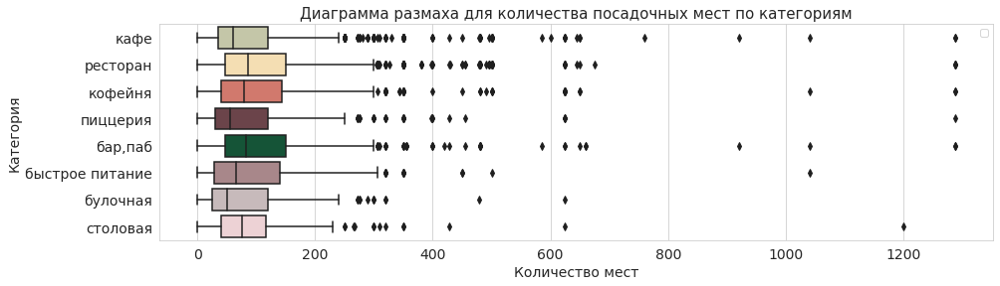

In [95]:
# построим диаграмму размаха

plt.figure(figsize=(15,4))
sns.boxplot(data=df, x="seats", y="category", hue="category", dodge=False, palette=color)
plt.title('Диаграмма размаха для количества посадочных мест по категориям', fontsize = 15)
plt.xlabel('Количество мест')
plt.ylabel('Категория')
plt.legend('')
plt.show()    

Минимальное значение для всех категорий равно нулю, а максимальное варьируется от 230 до 310.

Наиболее сильный разброс виден у ресторанов, кофеен, баров/пабов и заведений быстрого питания

Довольно много выбросов в сторону бОльших значений, необходимо для дальнешего анализа уменьшить масштаб.

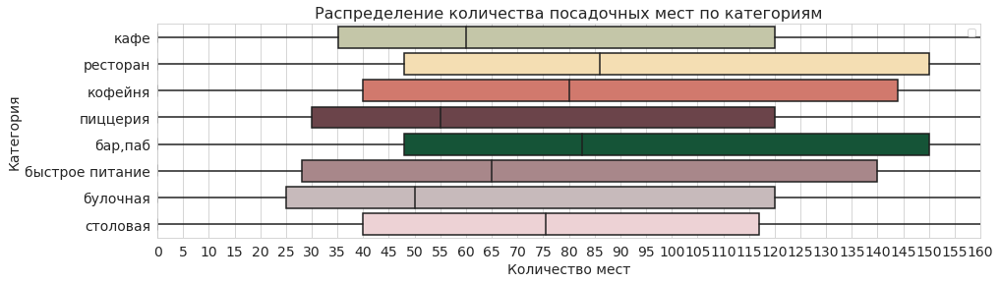

In [96]:
#построим такую же диаграмму, но уменьшим масштаб

plt.figure(figsize=(15,4))
sns.boxplot(data=df, x="seats", y="category", hue="category", dodge=False, palette=color)
plt.title('Распределение количества посадочных мест по категориям', fontsize = 16)
plt.xlabel('Количество мест')
plt.ylabel('Категория')

plt.legend('')
plt.xlim(0, 160)
x_major_locator=MultipleLocator(5)
ax=plt.gca()
ax.xaxis.set_major_locator(x_major_locator)
plt.show()    

Выводы
- Значение нижнего квартиля не опускается ниже 25, значение верхнего не выше 150
- Больше всего посадочных мест обычно в барах/пабах, кофейнях(что странно) и ресторанах
- Меньше всего в булочных и пиццериях
- Медиана по местам варьируется от 50 до 86, разница не большая

Далее для каждой категории распишем данные в формате название, диапазон нижний квартиль  - верхний квартиль, медиана


1. Булочная 25-120, 50
2. Пиццерия 30-120, 55
3. Кафе 35-120, 60
4. Заведение быстрого питания 28-140, 65
5. Столовая 40-117, 76
6. Кофейня 40-143, 80
7. Бар/паб 48-150, 83
8. Ресторан 48-150, 86

Посмотрим значение среднего чека для всех заведений

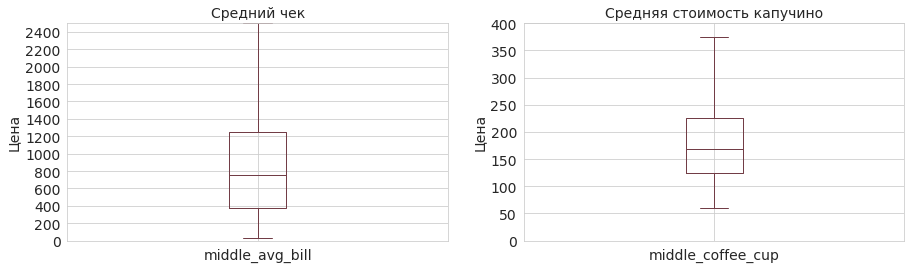

In [99]:
plt.figure(figsize=(15,4))

plt.subplot(1,2,1)
df.boxplot(column='middle_avg_bill', color='#723D46')
plt.title('Средний чек')
plt.ylabel('Цена')
plt.ylim(0,2500)
y_major_locator=MultipleLocator(200)
ax=plt.gca()
ax.yaxis.set_major_locator(y_major_locator)


plt.subplot(1,2,2)
df.boxplot(column='middle_coffee_cup', color='#723D46')
plt.title('Средняя стоимость капучино')
plt.ylabel('Цена')
plt.ylim(0, 400)

y_major_locator=MultipleLocator(50)
ax=plt.gca()
ax.yaxis.set_major_locator(y_major_locator)

plt.show()


Средний чек обычно варьируется от 400 до 1250 рублей, медиана - 750

Посмотрим на тип заведения, на столбец `chain`. Сразу отметим, что для небольших сетей могут встречаться ошибки.

- 0 - несетевое заведение
- 1 - сетевое заведение

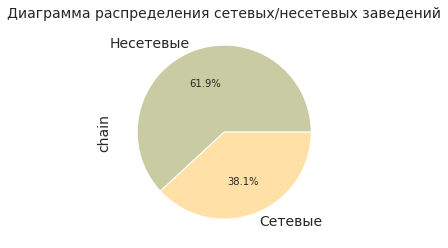

In [101]:
plt.figure(figsize=(10,4))
ax = df['chain'].value_counts().plot(kind='pie', labels = ['Несетевые', 'Сетевые'], colors=('#C9CBA3','#FFE1A8'), autopct='%1.1f%%', title='Диаграмма распределения сетевых/несетевых заведений')

Сетевых заведений 3205, а несетевых 5201, то есть, несетевых больше в ~1.5 раза, не учитывая ошибки для мелких сетей

Проверим какие категории чаще всего являеются сетевыми

In [38]:
#подготовим сводную таблицу
ch = df.pivot_table(index='category', columns='chain', values='name', aggfunc='count').sort_values(by=1, ascending=False)
ch

chain,0,1
category,,
кафе,1599,779
ресторан,1312,730
кофейня,693,719
пиццерия,303,330
быстрое питание,371,232
"бар,паб",596,169
булочная,99,157
столовая,227,88


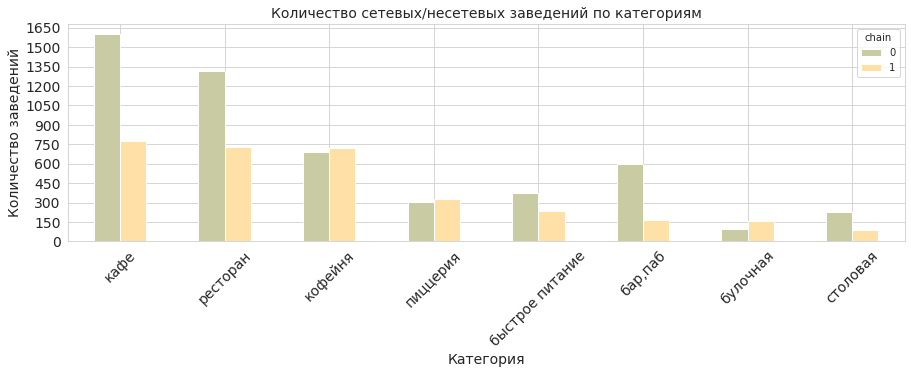

In [107]:
#построим столбчатую диаграммму

ch.plot(kind='bar', color=({0:'#C9CBA3', 1:'#FFE1A8'}), figsize=(15, 4))
plt.xticks(rotation=45)
plt.title('Количество сетевых/несетевых заведений по категориям', fontsize = 14)
plt.xlabel('Категория')
plt.ylabel('Количество заведений')

y_major_locator=MultipleLocator(150)
ax=plt.gca()
ax.yaxis.set_major_locator(y_major_locator)
plt.show()

Чаще всего сетевые заведения встречаются в кафе, ресторанах и кофейнях (естественно, общее количество этих заведений влияет на результат)

Рассмотрим категории отдельно.

Категории, в которых сетевые заведения превалируют:
 - кофейни (между сетевыми и несетевыми кофейянми небольшая разница на 27 единиц при общем количестве 1413 заведений)
 - пиццерии (аналогичная ситуация, разница в 27 единиц в пользу сетевых пиццерий, общее количество - 630)
 - булочные (сетевых булочных в 1,5 раза больше)
 
Категории, в которых несетевых заведений больше:
- кафе (почти в 2 раза больше несетевых заведений)
- рестораны (несетевых больше в 1,8 раз)
- заведения быстрого питания (в 1,5 раза больше несетевых)
- бары/пабы (самая ярко-выраженная разница в 3,5 раза)
- столовые (несетевых больше в 2,5 раза)




Как итог,
- булочные чаще встречаются сетевые
- пиццерии и кофейни с одинаковой частотой бывают сетевыми и несетевыми
- для баров и пабов видна сильная разница, несетевых заведений намного больше
- для остальных категорий (кафе, рестораны, заведения быстрого питания, столовые) несетевых заведений больше в 1,5-2,5 раза

Перейдем к анализу сетевых заведений

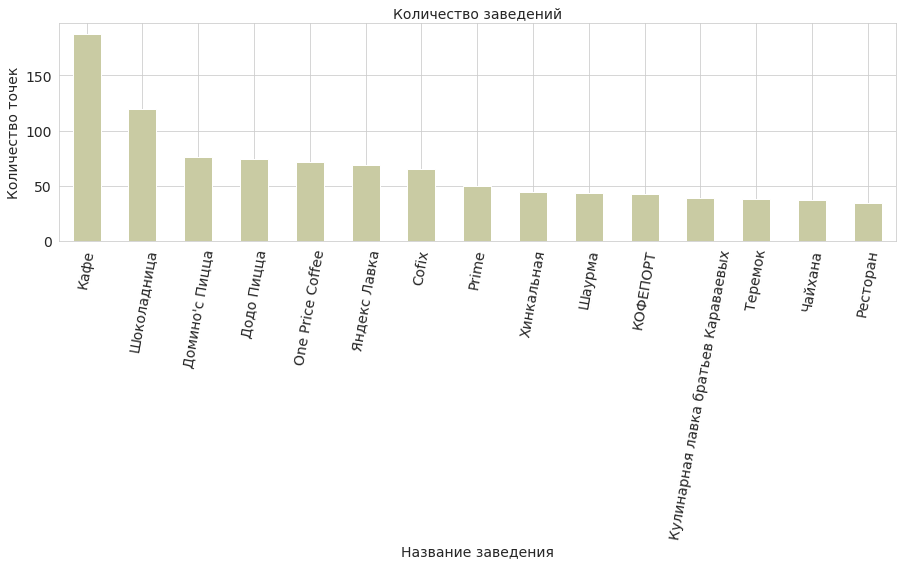

In [108]:
# сгрупируем данные по названиям заведений и выведем топ-15 названий по упоминаниям

plt.figure(figsize=(15,4))
df['name'].value_counts()[:15].plot(kind='bar', color='#C9CBA3')
plt.xticks(rotation=80)
plt.title('Количество заведений')
plt.xlabel('Название заведения')
plt.ylabel('Количество точек')

plt.show()

In [41]:
print('Топ-15 самых популярных сетей в Москве:')
print()
for e in df['name'].value_counts()[:15].index:
    print(f' {e}', end=',')

Топ-15 самых популярных сетей в Москве:

 Кафе, Шоколадница, Домино'с Пицца, Додо Пицца, One Price Coffee, Яндекс Лавка, Cofix, Prime, Хинкальная, Шаурма, КОФЕПОРТ, Кулинарная лавка братьев Караваевых, Теремок, Чайхана, Ресторан,

В списке предcтавлено три интересных названия:
1. Кафе (встречается чаще всего, более 180 раз)
2. Шаурма (более 43 точек)
3. Ресторан (более 25 упоминаний)

Это не одна сеть заведений, а множество точек с одним названием, поэтому в анализе их учитывать не будем.

А вот сеть ресторанов "Хинкальная" действительно есть в Москве


In [42]:
chain =  df['name'].value_counts()[1:14].index #список из популярных сетей (кроме "Кафе" и "Ресторан")

list_chain = df.query('name in @chain and name != "Шаурма"') #датасет, в котором представлены только 12 популярных сетей

Большинство заведений знакомые, действительно популярные сети. Попробуем определить есть ли у них общий признак. Пока на первый взгляд кажется, что преобладают кофейни

Построим столбчатые диаграммы для визуализации

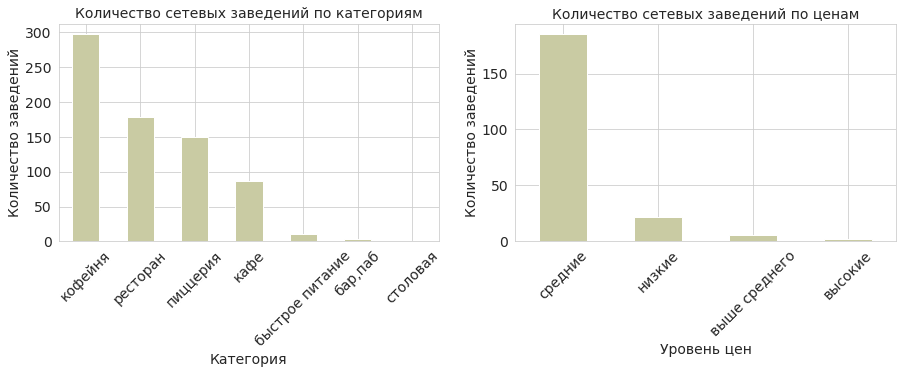

In [43]:
plt.figure(figsize=(15,4))

plt.subplot(1,2,1)
ax = list_chain['category'].value_counts().plot(kind='bar', color='#C9CBA3')
plt.title('Количество сетевых заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)

plt.subplot(1,2,2)
ax = list_chain['price'].value_counts().plot(kind='bar', color='#C9CBA3')
plt.title('Количество сетевых заведений по ценам')
plt.xlabel('Уровень цен')
plt.ylabel('Количество заведений')
plt.xticks(rotation=45)
plt.show()

Данные не совсем точные, заведениям одной и той же сети иногда могли присваивать разные категории. Но видно, что большек всего точек кофеен, дальше идут рестораны и пиццерии.

В сетевых заведениях цены, как правило, средние

Посмотрим средний чек в сетевых заведениях с помощью диаграммы размаха

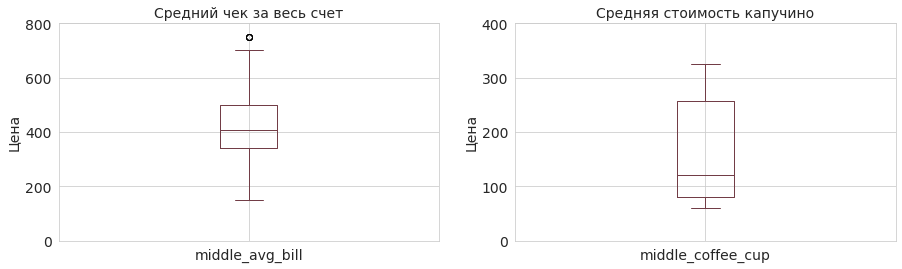

In [110]:
plt.figure(figsize=(15,4))

plt.subplot(1,2,1)
list_chain.boxplot(column='middle_avg_bill', color='#723D46')
plt.title('Средний чек за весь счет')
plt.ylabel('Цена')
plt.ylim(0,800)

plt.subplot(1,2,2)
list_chain.boxplot(column='middle_coffee_cup', color='#723D46')
plt.title('Средняя стоимость капучино')
plt.ylabel('Цена')
plt.ylim(0, 400)

plt.show()

Средний чек на все меню обычно варьируется от 350 до 500 рублей, медиана - 400, чашка капучино в среднем от 90 до 250, медиана - 120

Посмотрим по количеству посадочных мест

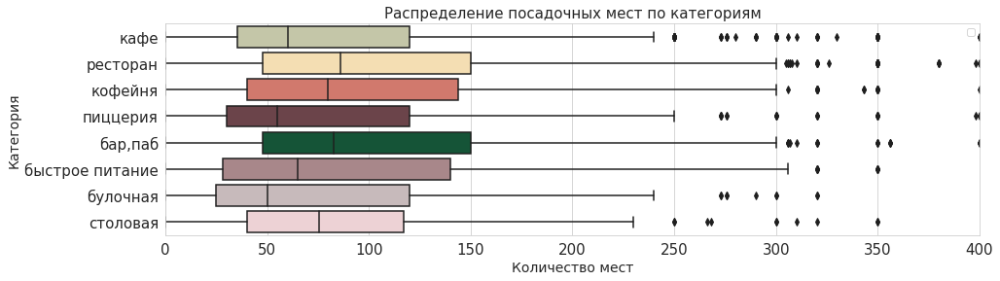

In [111]:
plt.figure(figsize=(15,4))
sns.boxplot(data=df, x="seats", y="category", hue="category", dodge=False, palette=color)
plt.title('Распределение посадочных мест по категориям', fontsize = 15)
plt.xlabel('Количество мест', fontsize = 14)
plt.ylabel('Категория', fontsize = 14)
plt.legend('')
plt.yticks(fontsize=15)
plt.xticks(fontsize=15)
plt.xlim(0,400)
plt.show()    

В среднем приходится от 40 до 150 посадочных мест. В сетевых заведениях обычно чуть меньше мест в булочных и пиццериях, а больше в ресторанах и барах/пабах

In [46]:
list_chain['is_24/7'].value_counts()

False    684
True      41
Name: is_24/7, dtype: int64

Всего 41 заведение из 725 работает круглосуточно и ежедневно

Итак, сделаем выводы, как строят свой бизнес сетевики.

Мы проанализировали такие сети как  Шоколадница, Домино'с Пицца, Додо Пицца, One Price Coffee, Яндекс Лавка, Cofix, Prime, Хинкальная,  КОФЕПОРТ, Кулинарная лавка братьев Караваевых, Теремок, Чайхана.

1. `Распределение по категориям`:
    - кофейни (297 точек):
        -  One Price Coffee
        - Cofix
        - КОФЕПОРТ
        - Шоколадница
    - рестораны (178 точек):
        - Теремок
        - Яндекс Лавка
        - Кулинарная лавка братьев Караваевых
        - Primе
    - пиццерии (150 точек)
        - Домино'с Пицца
       - Додо Пицца
    - кафе (86 точек)
        - Чайхана
        - Хинакальная

2. `Цены`
    Средний чек 350-500 рублей, средняя стоимость капучино - 90-250
3. `Посадочные места`
    В среднем их 40-140. Обычно больше мест в ресторанах и барах/пабах, а меньше в булочных и пиццериях
4. `Режим работы`
    Мало заведений работают круглосуточно (41 из 725)

Далее перейдем к месторасположению заведений

In [47]:
#выведем название округа и количество всех заведений, которое есть в нем

df['district'].value_counts()

Центральный административный округ         2241
Северный административный округ             900
Южный административный округ                891
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: district, dtype: int64

In [48]:
#построим сводную таблицу по количеству заведений в каждой катеогории и районе
buildings_by_category = df.pivot_table(index='district', columns='category', values='name', aggfunc='count')
buildings_by_category['total']= buildings_by_category.sum(axis=1)
buildings_by_category = buildings_by_category.reset_index().sort_values(by='total', ascending=False)
buildings_by_category.drop(columns=['total'], inplace=True)
buildings_by_category

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
5,Центральный административный округ,364,50,87,464,427,113,670,66
2,Северный административный округ,68,39,58,235,193,77,189,41
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40
8,Южный административный округ,68,25,85,264,131,73,201,44
1,Западный административный округ,50,37,62,239,150,71,218,24
0,Восточный административный округ,53,25,71,272,105,72,160,40
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18


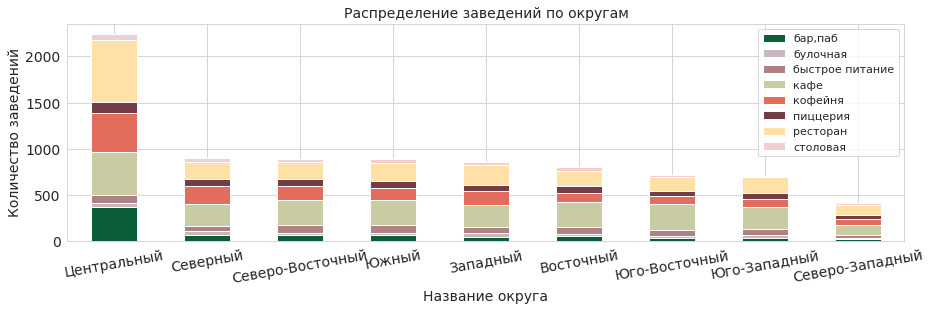

In [114]:
buildings_by_category['district'] = buildings_by_category['district'].map(lambda x: x.split()[0])
buildings_by_category.plot(x='district', kind='bar', stacked = True, figsize=(15,4), color=color)

plt.xticks(rotation=10)
plt.title('Распределение заведений по округам')
plt.xlabel('Название округа')
plt.ylabel('Количество заведений')
plt.legend(fontsize=11)

plt.show()

Представлено 9 округов

- Лидирует Центральный округ, больше всего заведений находится там
- Далее на примерно одинаковом уровне идут Северный, Южный, Северо-Западный, Восточный, Юго-Восточный и Юго-Западный

- Меньше всего заведений в Северо-Западной части Москвы

Категории распределены по округам примерно в том же соотношении. Видно преобладание таких категорий, как кафе и рестораны


Посмотрим распределения рейтингов по категориям заведений

Построим графики размаха

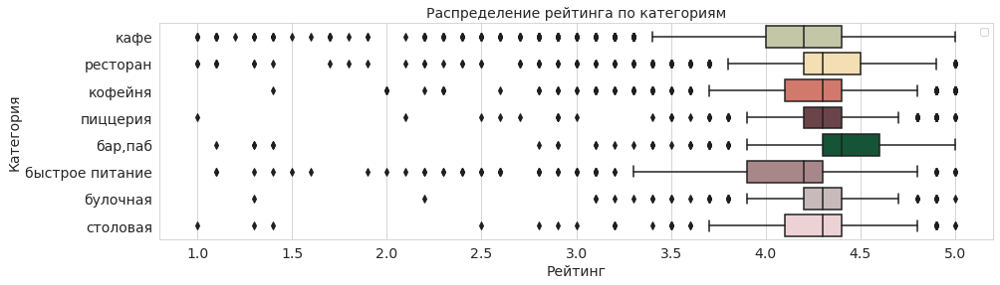

In [115]:
plt.figure(figsize=(15,4))
sns.boxplot(data=df, x="rating", y="category", hue="category", dodge=False, palette=color)
plt.title('Распределение рейтинга по категориям')
plt.xlabel('Рейтинг')
plt.ylabel('Категория')
plt.legend('')
plt.show()    

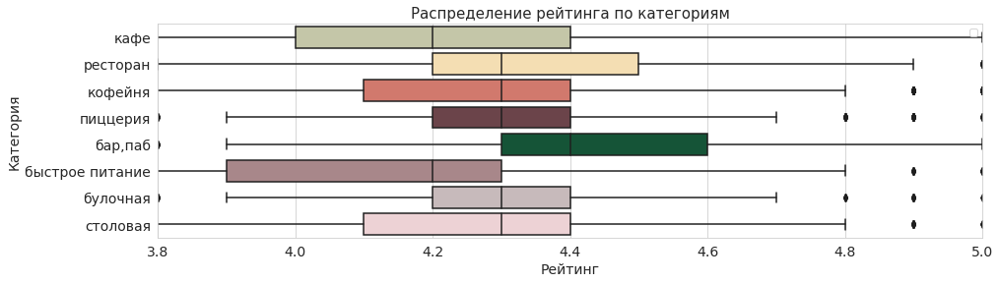

In [116]:
plt.figure(figsize=(15,4))
sns.boxplot(data=df, x="rating", y="category", hue="category", dodge=False, palette=color)
plt.title('Распределение рейтинга по категориям', fontsize = 15)
plt.xlabel('Рейтинг')
plt.ylabel('Категория')
plt.legend('')
plt.xlim(3.8,5)
plt.show()    

Больше всего выбросов в сторону минимального рейтинга у кафе, ресторанов и заведений быстрого питания. Стоит учитывать, что категория кафе и ресторанов преобладают, поэтому там отрицательные оценки естественне, чем для заведений быстрого питания

Для всех категорий, кроме заведений быстрого питания, в среднем значения варьируются от 3,7 до 4,6 баллов. 

- ниже всего рейтинги у заведений быстрого питания и кафе с медианой в 4.2
- далее идут столовые и кофейни с похожими друг на друга показателями, медиана - 4.3
- у ресторанов, пиццерий и булочных нижний квартиль начинается с 4.2, а медиана 4.3
- лучше всего результат у баров/пабов, где средний рейтинг варьируется от 4.1 до 4.6, медиана - 4.4

Построим фоновую диаграмму со средним рейтингом заведений каждого района

In [52]:
#подготовим таблицу с названием района и средним рейтингом

rating_df = df.groupby('district', as_index=False)['rating'].agg('median')
rating_df.head(2)

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.3


In [54]:
try:
    with open('C:/Users/belle/OneDrive/Рабочий стол/Новая папка/Мои проекты/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)
except:
    with open('/datasets/admin_level_geomap.geojson', 'r') as f:
        geo_json = json.load(f)

In [55]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data= geo_json,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

m

Выше всего рейтинг у заведений в сердце Москвы -в  Центральном районе

А ниже всего рейтинги в Юго-Восточном и Cеверно-Восточном

Разница между ними  небольшая, между самым высоким и низким медианным значением всего 0.2 пункта

Отобразим заведения на карте

In [56]:
moscow_lat, moscow_lng = 55.751244, 37.618423


m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

#напишем функцию, которая принимает координаты и создает маркер
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)


df.apply(create_clusters, axis=1)
m

Рассмотрим самые популярные улицы

In [57]:
#выведем топ-15 улиц с наибольшим количеством заведений
s = df['street'].value_counts()[:15]
s

проспект Мира             184
Профсоюзная улица         122
проспект Вернадского      108
Ленинский проспект        107
Ленинградский проспект     95
Дмитровское шоссе          88
Варшавское шоссе           76
Каширское шоссе            76
Ленинградское шоссе        70
Люблинская улица           60
улица Вавилова             55
Кутузовский проспект       54
улица Миклухо-Маклая       49
Пятницкая улица            48
Алтуфьевское шоссе         47
Name: street, dtype: int64

Посмотрим заведения какой категории находятся на этих улицах

In [58]:
pop_street = df.query('street in @s.index')
pop_street = pop_street.pivot_table(index='street', columns='category', values='name', aggfunc='count').reset_index()
pop_street['total'] = pop_street.sum(axis=1)
pop_street = pop_street.sort_values(by='total', ascending=False)
pop_street.drop(columns=['total'], inplace=True)
pop_street

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
12,проспект Мира,12.0,4.0,21.0,53.0,36.0,11.0,45.0,2.0
9,Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0
11,проспект Вернадского,7.0,1.0,12.0,25.0,16.0,12.0,33.0,2.0
7,Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
5,Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
2,Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
1,Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
3,Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,18.0,5.0
6,Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
8,Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0


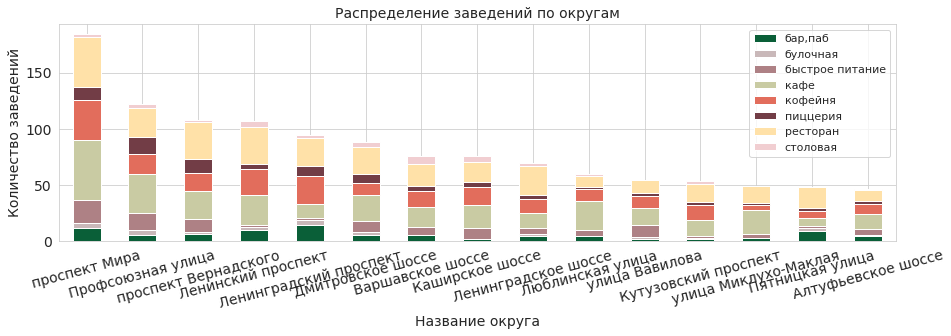

In [118]:
#визуализируем таблицу 

pop_street.plot(x='street',kind='bar', stacked=True, figsize=(15,4), color=color)

plt.xticks(rotation=15)
plt.title('Распределение заведений по округам')
plt.xlabel('Название округа')
plt.ylabel('Количество заведений')
plt.legend(fontsize=11)
plt.show()

По количеству заведений на одной улице лидирует проспект Мира. Далее идет Профсоюзная улица, проспект Вернандского и Ленинский проспект

По диаграмме снова можно увидеть популярность кафе, ресторанов и кофеен.

- баров/пабов больше всего на Ленинградском проспекте
- заведений быстрого питания, кафе, кофеен, ресторанов больше всего на проспекте Мира
- пиццерий больше всего на Профсоюзной улице
- столовых больше всего на Варшавском шоссе

Посмотрим на улицы, на которых только один объект общепита

In [60]:
one_b = df.groupby('street')['name'].count().to_frame().query('name==1').index
one_b = df.query('street in @one_b')
one_b

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
12,Заправка,кафе,"Москва, МКАД, 80-й километр, 1",Северный административный округ,вт-сб 09:00–18:00,55.899938,37.517958,4.3,средние,Средний счёт:330 ₽,330.0,NaN,0,NaN,"МКАД, 80-й километр",False
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
28,Mafe,кафе,"Москва, МКАД, 78-й километр, 14к1",Северный административный округ,"ежедневно, 10:00–19:00",55.893061,37.501319,3.8,средние,Средний счёт:400–600 ₽,500.0,NaN,0,NaN,"МКАД, 78-й километр",False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,Мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица Шкулёва,False
8294,WTFcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,0,NaN,улица Артюхиной,False
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,1,40.0,Новороссийская улица,False


In [61]:
# распределение по категориям заведений
one_b['category'].value_counts()

кафе               169
ресторан            93
кофейня             87
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

In [62]:
# распределение по расположению заведений
one_b['district'].value_counts()

Центральный административный округ         145
Северо-Восточный административный округ     55
Северный административный округ             54
Восточный административный округ            54
Южный административный округ                44
Юго-Восточный административный округ        41
Западный административный округ             37
Северо-Западный административный округ      20
Юго-Западный административный округ         20
Name: district, dtype: int64

In [63]:
# распределение по ценам в заведениях
one_b['price'].value_counts()

средние          122
выше среднего     29
высокие           22
низкие            11
Name: price, dtype: int64

In [64]:
#распределение по признаку сетевое/несетевое заведение
one_b['chain'].value_counts()

0    329
1    141
Name: chain, dtype: int64

In [65]:
#распределение по режиму работы
one_b['is_24/7'].value_counts()

False    434
True      36
Name: is_24/7, dtype: int64

Ничего необычного для заведений, которые единственные на улице, не было найдено

Посчитаем средний чек для каждого района

In [66]:
#подготовим таблицу с названием района и средним чеком в нем
district = df.groupby('district')['middle_avg_bill'].median().to_frame().reset_index()
district

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [67]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data= geo_json,
    data=district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

m

Самые "дорогие" районы - Центральный и Западный со средним чеком в тысячу рублей.

Ниже всего средний чек в Северо-Восточном, Южном и Юго-Восточном округах

А значит, цены действительно зависят от отдаленности от центра

Посмотрим заведения с низким рейтингом (3.7 и ниже)

In [68]:
#напишем функцию для анализа заведений по рейтингу. Функция принимает название колонки и выводит таблицу со значениями:

#total - общее количество заведений по каждой категории

#high_rat - количество заведений с высоким рейтингом (4.8 и выше) по категориям 
#low_rat - количество заведений с низким рейтингом (3.7 и выше) по категориям

#ratio_high_rat - соотношение общего количества заведений и заведений с высоким рейтингом
#ratio_low_rat - соотношение общего количества заведений и заведений с низким рейтингом

def rating(column):
    x = df[column].value_counts()
    tot = pd.DataFrame({'name':x.index, 'total':x.values})
    x = df.query('rating<3.7')[column].value_counts()
    low_rat= pd.DataFrame({'name':x.index, 'low_rat':x.values})
    table = tot.merge(low_rat, on = 'name')
    table['ratio_low_rat'] = round(table['total'] / table['low_rat']).astype('int')
    display(table)

    table = table.sort_values(by='ratio_low_rat', ascending=False).reset_index()
    print(f'Низкий рейтинг примерно имеет каждое(ая/ые):')
    print()
    for e in range(table.shape[0]):
        print(f' {table.loc[e, "ratio_low_rat"]} заведение категории {table.loc[e, "name"]}')

In [69]:
rating('category')

,name,total,low_rat,ratio_low_rat
0,кафе,2378,285,8
1,ресторан,2042,92,22
2,кофейня,1412,56,25
3,"бар,паб",765,19,40
4,пиццерия,633,14,45
5,быстрое питание,603,87,7
6,столовая,315,18,18
7,булочная,256,11,23


Низкий рейтинг примерно имеет каждое(ая/ые):

 45 заведение категории пиццерия
 40 заведение категории бар,паб
 25 заведение категории кофейня
 23 заведение категории булочная
 22 заведение категории ресторан
 18 заведение категории столовая
 8 заведение категории кафе
 7 заведение категории быстрое питание


Пицериям и барам/пабам реже всего ставят негативные отзывы, а вот у кафе и заведений быстрого питания больше всего точек с плохим рейтингом

In [70]:
rating('district')

,name,total,low_rat,ratio_low_rat
0,Центральный административный округ,2241,42,53
1,Северный административный округ,900,53,17
2,Южный административный округ,891,82,11
3,Северо-Восточный административный округ,891,79,11
4,Западный административный округ,851,65,13
5,Восточный административный округ,798,76,10
6,Юго-Восточный административный округ,714,94,8
7,Юго-Западный административный округ,709,61,12
8,Северо-Западный административный округ,409,30,14


Низкий рейтинг примерно имеет каждое(ая/ые):

 53 заведение категории Центральный административный округ
 17 заведение категории Северный административный округ
 14 заведение категории Северо-Западный административный округ
 13 заведение категории Западный административный округ
 12 заведение категории Юго-Западный административный округ
 11 заведение категории Южный административный округ
 11 заведение категории Северо-Восточный административный округ
 10 заведение категории Восточный административный округ
 8 заведение категории Юго-Восточный административный округ


В Центральном округе меньше всего заведений с низким рейтингом (в соотношении) - каждое 53 заведение с низким рейтингом.

В в Юго-Восточной части города каждое 8 заведение с плохим рейтингом


In [71]:
rating('price')

,name,total,low_rat,ratio_low_rat
0,средние,2117,55,38
1,выше среднего,564,4,141
2,высокие,476,7,68
3,низкие,156,12,13


Низкий рейтинг примерно имеет каждое(ая/ые):

 141 заведение категории выше среднего
 68 заведение категории высокие
 38 заведение категории средние
 13 заведение категории низкие


Чаще всего низкий рейтинг ставят заведениям с низкими цеными, а реже всего заведениям с ценами выше среднего

In [72]:
rating('chain')

,name,total,low_rat,ratio_low_rat
0,0,5200,396,13
1,1,3204,186,17


Низкий рейтинг примерно имеет каждое(ая/ые):

 17 заведение категории 1
 13 заведение категории 0


Немного чаще низкий рейтинг ставят сетевым заведениям

Вывод

- В Москве больше всего кафе, ресторанов и кофеен. Дальше по популярности идут бары/пабы, пиццерии и быстрое питания, довольно мало столовых и булочных
- В среднем посадочных мест в заведениях 50-86
- Средний чек обычно варьируется от 400 до 1250 рублей, медиана - 750
- В среднем несетевых заведений в ~1.5 раз больше, чем сетевых. 
    - кофени, пиццерии и булочные - исключения. Сетевых заведений здесь больше
- По сетевым заведениям:
    - чаще всего это кофейни, еще рестораны и пиццерии
    - как правило, средние цены:
        - средний чек около 400 рублей
        - средняя стоимость капучино около 120 рублей
    - медиана сидячих мест варьируется от 50 до 80
- Больше всего заведений в Центральном районе, меньше всего в Северно-Западном
- Более низкие оценки ставят кафе и заведениям быстрого питания, а более высокие барам/пабам
- Выше всего рейтинги у заведений Центрального района, ниже всего рейтинги в Юго-Восточном и Cеверно-Восточном, но разница небольшая
- На одной улице может располагаться до 184 заведений (именно столько на самой популярной - улице Мира). Также хочется отметить такие популярные улицы, как Профсоюзная, Ленинский проспект, Ленинградский проспект
    - баров/пабов больше всего на Ленинградском проспекте
    - заведений быстрого питания, кафе, кофеен, ресторанов больше всего на проспекте Мира
    - пиццерий больше всего на Профсоюзной улице
- Выше всего цены в Центральном и Западном районе,ниже  в Северо-Восточном, Южном и Юго-Восточном районах
- Заведения, которым охотнее ставят низкие оценки:
    - относятся к категории быстрого питания и кафе
    - находятся в Юго-Восточном округе
    - имеют низкие цены

## Идея - открыть кофейню

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Заказчики не боятся конкуренции в этой сфере, хотя кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

Ответьте на следующие вопросы:

Постройте визуализации. Попробуйте дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.

In [73]:
#в cof только кофейни:

cof = df.query('category == "кофейня"')

In [74]:
cof.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
45,9 Bar Coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False


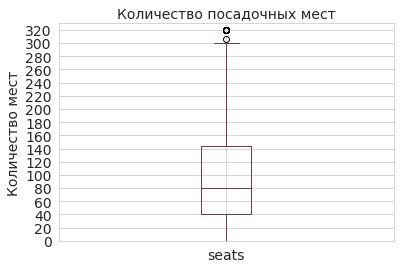

In [75]:
# построим диаграмму размаха по количеству посадочных мест в кофенях

cof.boxplot(column='seats', color='#723D46')
plt.title('Количество посадочных мест')
plt.ylabel('Количество мест')
plt.ylim(0,330)

y_major_locator=MultipleLocator(20)
ax=plt.gca()
ax.yaxis.set_major_locator(y_major_locator)


Медианное значение посадочных мест равно 80

In [76]:
#посмотрим количество кофеен, которые работают еждневно и круглосуточно
len(cof[cof['is_24/7'] == True])

58

In [77]:
#выведем медианную средняя стоимость капучино по районам

district_cof = cof.groupby('district')['middle_coffee_cup'].median().to_frame().reset_index()
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data= geo_json,
    data=district_cof,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианная средняя стоимость капучино по районам',
).add_to(m)

m


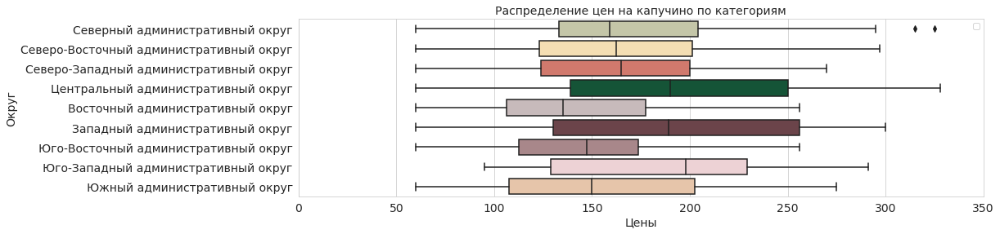

In [119]:
#построим диаграмму размаха

plt.figure(figsize=(15,4))
sns.boxplot(data=cof, x="middle_coffee_cup", y="district", hue="district", dodge=False, palette=color_dis)
plt.title('Распределение цен на капучино по категориям')
plt.xlabel('Цены')
plt.ylabel('Округ')
plt.legend('')
plt.xlim(0,350)
plt.show()

In [79]:
#выведем медианный рейтинг кофейн по районам
rating_df_cof = cof.groupby('district', as_index=False)['rating'].agg('median')

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data= geo_json,
    data=rating_df_cof,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофейн по районам',
).add_to(m)

m

Во всех районах Москвы медиана рейтинга - 4.3, исключение - Западный округ с рейтингом 4.2

Отобразим все кофейни на карте

In [80]:
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

marker_cluster = MarkerCluster().add_to(m)

#напишем функцию, которая принимает координаты и создает маркер
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)


cof.apply(create_clusters, axis=1)
m

Чем дальше от центра - тем меньше кофеен

Изучим крупные сети

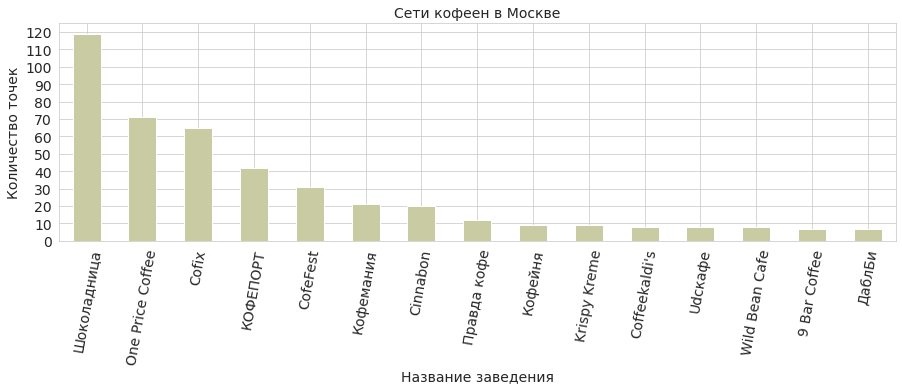

Топ-15 самых популярных сетей кофеен в Москве:

 Шоколадница, One Price Coffee, Cofix, КОФЕПОРТ, CofeFest, Кофемания, Cinnabon, Правда кофе, Кофейня, Krispy Kreme, Coffeekaldi's, Udcкафе, Wild Bean Cafe, 9 Bar Coffee, ДаблБи,

In [120]:
plt.figure(figsize=(15,4))
cof['name'].value_counts()[:15].plot(kind='bar', color='#C9CBA3')
plt.xticks(rotation=80)
plt.title('Сети кофеен в Москве')
plt.xlabel('Название заведения')
plt.ylabel('Количество точек')
y_major_locator=MultipleLocator(10)
ax=plt.gca()
ax.yaxis.set_major_locator(y_major_locator)

plt.show()

print('Топ-15 самых популярных сетей кофеен в Москве:')
print()
for e in cof['name'].value_counts()[:15].index:
    print(f' {e}', end=',')

In [82]:
c_chain =  cof['name'].value_counts()[1:14].index 
cof_chain = df.query('name in @c_chain') 

In [83]:
for e in cof_chain.columns[8:-2]:
    print(f'В столбце {e} {cof_chain[e].isna().sum()} пропущенных значений, то есть {round(cof_chain[e].isna().sum() * 100/cof_chain.shape[0])}%')

В столбце price 275 пропущенных значений, то есть 86%
В столбце avg_bill 192 пропущенных значений, то есть 60%
В столбце middle_avg_bill 287 пропущенных значений, то есть 89%
В столбце middle_coffee_cup 226 пропущенных значений, то есть 70%
В столбце chain 0 пропущенных значений, то есть 0%
В столбце seats 139 пропущенных значений, то есть 43%


В столбцах много пропусков и поэтому верно исследовать данные по сетям нельзя.

## Вывод

Всего в датасете 1413 кофеен

Посадочных мест обычно от 40 до 145, медиана - 80. 

Примерно одинаковое количество сетевых и несетевых кофеен

Кофейни популярны в Москве, можно выделить таких "гигантов", как Шоколадница, One Price Coffee, Cofix и КОФЕПОРТ 

Количество кофеен зависит от от отдалённости  от центра Москвы. Больше всего кофеен в Центральном районе (лидер по общему количеству заведений - 428). Далее:

- 193 в Северном
- 150, 159 в Западном, Северо-Восточном
- 131 в Южном
- 105, 96, 89 в Восточном, Юго-Западном и Юго-Восточном
- 62 в Северо-Западном

Распределение кофеен по самым популярным улицам Москвы:

- 25-36 на проспекте Мира, Ленинском проспекте и Ленинградском
- 13-18 на Профсоюзной улице, проспекте Вернандского, Каширском, Варшавском и Ленинградском шоссе, Кутузовском проспекте
- 9-11 на Дмитровском и Алтуфьевском шоссе, улице Вавилова и Люблинской
- 4-6 на улице Миклухо-Маклая и Пятницкой

Кофейням в среднем ставят оценку 4.1-4.4, медиана 4.3. Рейтинг 4.3 является медианой во всех районах Москвы кроме Западного. Там он равен 4.2
        
Всего 59 кофеен работают ежедневно и круглосуточно (4.2%)

Средняя стоимость капучино в кофейнях варьируется от 120 до 220, медиана - 170. Стоит опираться именно на эту цифру (170), так как это цена, проверенная временем. Покупатель готов приобрести кофе за такую сумму, а продавцам это не в убыток. Цену можно варьировать в диапазоне от 120 до 220 в зависимости от района:
- выше всего в Центральном и Юго-Западном (медиана 189-198)
- ниже всего в Восточном округе (медиана 135)
- в остальных районах медиана варьируется от 147 до 165

## Рекомендации к открытию
- открыть небольшую кофейню на 40 мест (чтобы не начинать с чего-то очень большого, но суметь вместить себя всех желающих)
- открыться не в центре, но и не слишком далеко от центра (меньше конкуренция и ниже цена аренды/покупки заведения). Например, в Южном, Восточном или Юго-Восточном округе
- ориентироваться на цену капучино не более 170, если мы говорим не о центре Москвы. Например, в Южном около 150, а Восточном 130